# 카드사 이탈 고객 예측 분석

데이터셋 출처: https://www.kaggle.com/sakshigoyal7/credit-card-customers

# Contents

1. 시나리오

2. 데이터 분석 목표

3. EDA

4. Feature Engineering

5. 모델링

6. 결과 해석

## 1. 시나리오 간단 정리
저는 카드사의 직원으로 카드사에 가입한 고객들 중 이용을 안 해서 계좌가 닫히기 전에 이벤트 문자 등을 보내려고 한다는 시나리오를 설정하였습니다. 실제로 저도 자주 사용하지 않는 자산관리 앱에서 알림을 보내면 들어가 보기 때문에, 알림을 보내는 것은 휴면 고객들을 다시 끌어들이는 데에 효과적일 것 같습니다. 사용한 데이터 세트는 한 카드사에서 제공한 여러가지 고객정보를 통한 이탈 고객 예측 데이터입니다.







## 2. 데이터 분석 목표
#####1) 이탈 고객들을 예측해서 미리 문자나 알림을 보내 이탈을 막습니다. 
#####2) 고객 이탈에 영향이 큰 특성을 찾아 서비스를 개선합니다.




In [2]:
import pandas as pd
import numpy as np

df = pd.read_csv('https://raw.githubusercontent.com/terri1102/data_analysis_portfolio/main/BankChurners.csv')
df = df.iloc[:, :21]      #마지막 두 열은 데이터 제공자가 나이브 베이즈 분류를 한 결과인데, 데이터셋 제공자가 잘못 넣은 것이라고 하니 삭제해줍니다.
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


## 3. EDA

In [ ]:
df.dtypes

CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

## 특성 간 상관관계

먼저 수치형 특성과 카테고리형 특성으로 나누어서 살펴보기 전에 pandas-profiling을 통해 전체적인 데이터셋의 특징을 파악해보겠습니다.

In [ ]:
!pip install -U pandas-profiling

In [4]:
import pandas_profiling
df.profile_report() 

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

전반적으로 상관관계가 높아보이는 특성들이 많아 보입니다. 아래의 분석에서 더 자세히 알아보겠습니다.

### 수치형 특성

특성들 중에서 수치형 데이터들을 먼저 분석해보겠습니다. 피어슨 상관관계를 통해서 특성들의 관계를 알아보겠습니다.

Text(0.5, 1.0, 'Pearson Correlation Matrix')

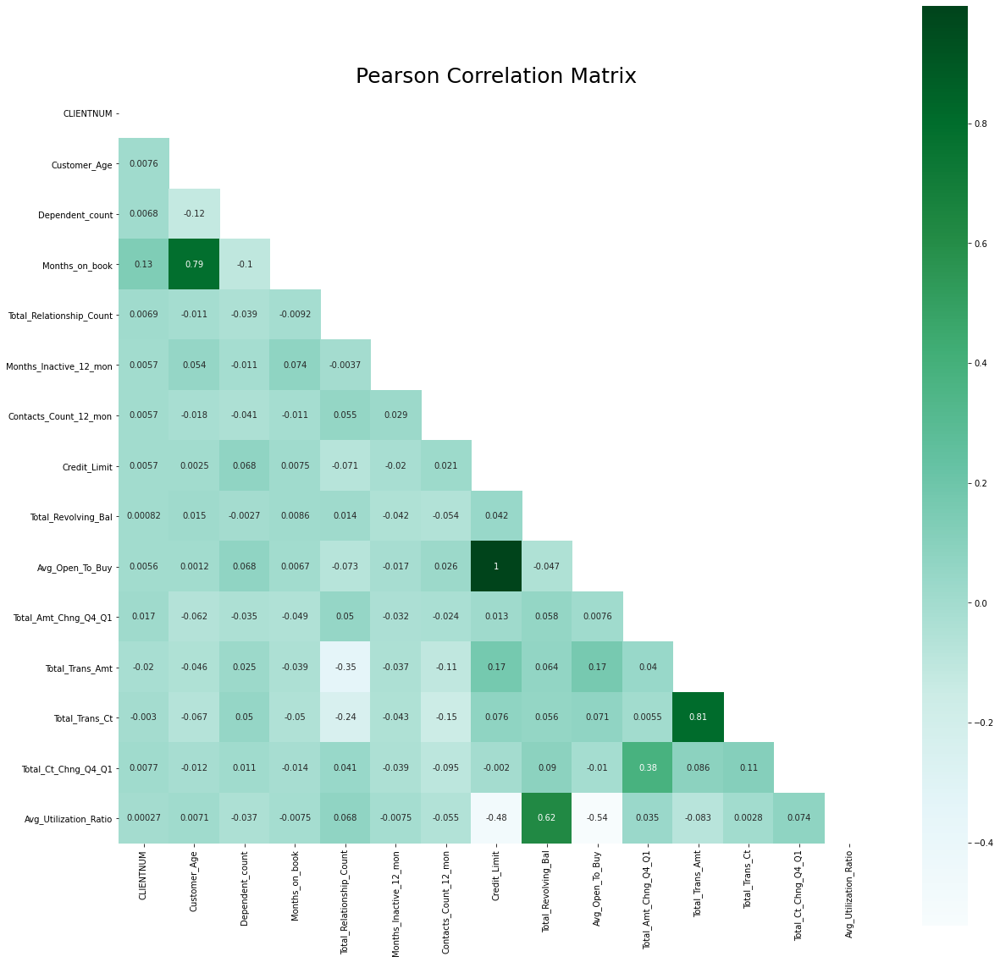

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import normalize

mask = np.zeros_like(df.corr(), dtype=np.bool) 
mask[np.triu_indices_from(mask)] = True 

fig = plt.figure(figsize=(20,20))
chart = sns.heatmap(df.corr(), mask=mask,square=True,cmap="BuGn", annot=True)



#f, ax = plt.subplots(figsize=(16, 12))
plt.title('Pearson Correlation Matrix',fontsize=25)

위의 히트맵에서 보면 상관계수가 0.6 이상인 특성들이 보입니다. 이들의 관계를 하나하나 살펴보겠습니다.


####1. Total_Revolving_Balance, Avg_Open_To_Buy, Credit_Limit의 관계

처음에는 Total_Revolving_Bal을 우리나라의 리볼빙 서비스와 비슷한 개념이라고 생각해서 다른 특성과의 관계를 생각을 못했는데, Open_To_Buy credit line의 개념을 찾아보다 보니 Credit_Limit = Avg_Open_To_Buy + Total_Revolving_Balance인 것을 알게 되었습니다. 즉, 한국에서는 리볼빙 결제가 선택 사항이지만, 미국에서는 리볼빙 결제가 기본이기 때문에 모든 고객 샘플에 리볼빙 결제의 데이터가 들어 있습니다. 제가 이해한 바로는 신용 한도에서 사용 대금(Revolving_Balance)를 뺀 것이 Open_To_Buy이기에 한도 내에서 사용 가능한 금액이라고 번역하려고 합니다.

출처: http://hyouka.egloos.com/v/1069095

아래에서 세 특성을 비교해 보면 Avg_Open_To_Buy + Total_Revolving_Balance = Credit_Limit 인 것을 잘 알 수 있습니다. 따라서 겹치는 특성이기 때문에 전처리 과정에서 Avg_Open_to_Buy 특성을 제거할 것입니다. 

In [ ]:
rvdf = df[['Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Credit_Limit']]
rvdf.head(5)

,Total_Revolving_Bal,Avg_Open_To_Buy,Credit_Limit
0,777,11914.0,12691.0
1,864,7392.0,8256.0
2,0,3418.0,3418.0
3,2517,796.0,3313.0
4,0,4716.0,4716.0


####2.Total_Revolving_Bal, Credit_Limit, Avg_Utilization_ratio의 관계

Utilization_ratio = The amount of revolving credit / credit limits로, 결제 대금(Total_Revolving_Balance)을 신용한도로 나눈 것이 한도 내 사용률이라고 할 수 있습니다. 이 지표는 기존에 있던 특성들을 사용해서 만든 특성이긴 해도 실제로 신용점수에 큰 영향을 주는 지표라고 알려져 있기에 그대로 사용할 것입니다.

출처: https://www.experian.com/blogs/ask-experian/what-is-revolving-credit/

In [ ]:
creditscore = df[['Total_Revolving_Bal', 'Credit_Limit','Avg_Utilization_Ratio']]
creditscore['test'] = creditscore['Total_Revolving_Bal']/creditscore['Credit_Limit']
creditscore

,Total_Revolving_Bal,Credit_Limit,Avg_Utilization_Ratio,test
0,777,12691.0,0.061,0.061224
1,864,8256.0,0.105,0.104651
2,0,3418.0,0.000,0.000000
3,2517,3313.0,0.760,0.759734
4,0,4716.0,0.000,0.000000
...,...,...,...,...
10122,1851,4003.0,0.462,0.462403
10123,2186,4277.0,0.511,0.511106
10124,0,5409.0,0.000,0.000000
10125,0,5281.0,0.000,0.000000


#### 3. Total_Trans_ct와 Total_Trans_amt의 관계

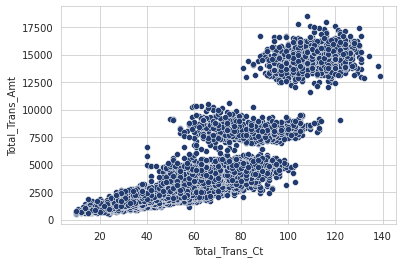

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.scatterplot(x='Total_Trans_Ct', y='Total_Trans_Amt', data=df);

총 결제 횟수와 총 결제 금액의 관계이기 때문에 양의 상관관계가 있습니다. 하지만 개념의 차이가 있기 때문에 두 특성을 모두 사용하겠습니다.

#### 4. Customer Age와 Month on Book의 관계

In [ ]:
month_and_age = df[['Customer_Age','Months_on_book']]
month_and_age.corr().iloc[0,1]

0.7889123589930808

상식적으로 카드 소유자의 나이와 계좌 개설 기간은 양의 상관 관계가 있습니다. 상관계수는 0.78로 높은 편이지만, 소유주의 나이는 부양 가족, 결혼 여부 등과 관련이 있을 것 같은 특성이고, 계좌 개설 기간이 길어 거래 기간이 길수록 신용 점수나 신용 한도가 늘어나는 특징이 있기 때문에 두 특성 모두 사용할 것입니다.

#### 5. Months_Inactive_12_mon와	Contacts_Count_12_mon의 관계

In [ ]:
numerical_features = df.select_dtypes('number').columns
df[numerical_features]

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [ ]:
df[numerical_features].describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


Months_Inactive_12_mon과	Contacts_Count_12_mon의 분포가 비슷해서 두 특성을 비교해 봤지만, 샘플별로 두 특성이 다른 값이어서 다른 특성이라고 볼 수 있을 것 같습니다.

In [ ]:
df[['Months_Inactive_12_mon',	'Contacts_Count_12_mon']]

,Months_Inactive_12_mon,Contacts_Count_12_mon
0,1,3
1,1,2
2,1,0
3,4,1
4,1,0
...,...,...
10122,2,3
10123,2,3
10124,3,4
10125,3,3


### 결측치 찾기

In [ ]:
df.isna().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

결측치는 없습니다.

### 이상치 찾기



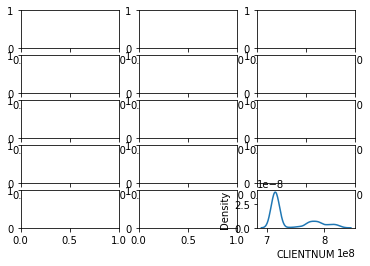

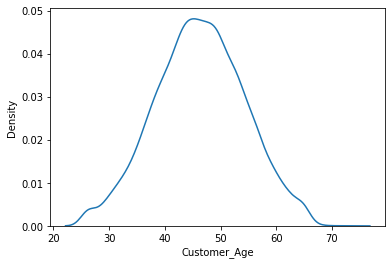

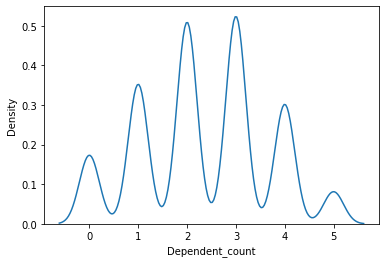

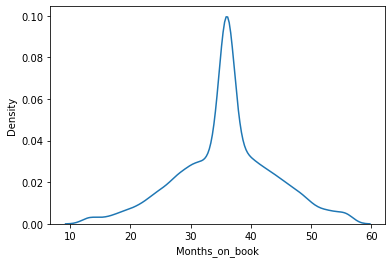

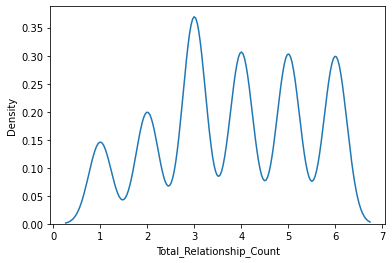

...

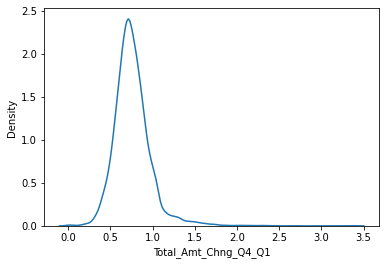

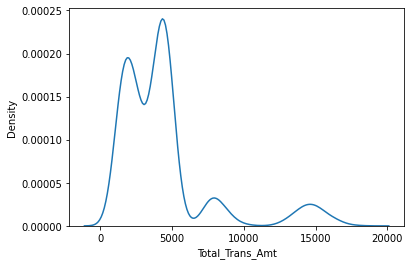

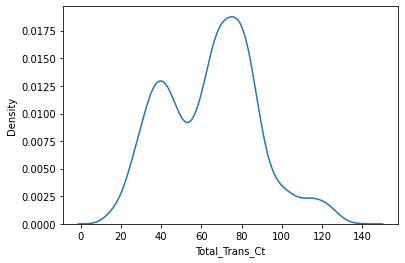

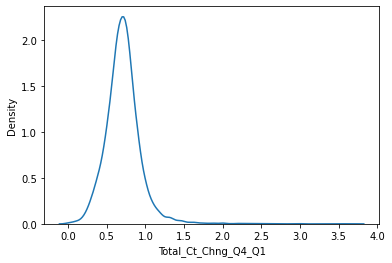

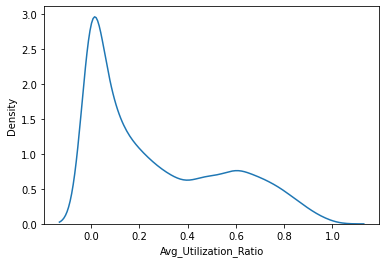

In [ ]:
fig. ax = plt.subplots(5,3)
for col in numerical_features:
  ax = sns.kdeplot(df[col])
  plt.show()

특성별로 KDE plot을 그려보았을 때 이상치는 찾기 어려워 보입니다.
그렇지만 Credit_Limit 특성은 상위 구간이 약간 몰려있기 때문에 조금 더 자세히 살펴보겠습니다. Avg_Open_To_Buy 특성은 삭제할 특성이기에 생략합니다.

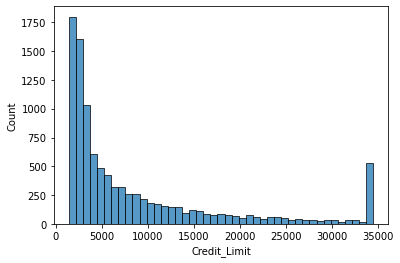

In [ ]:
sns.histplot(df.Credit_Limit);

히스토그램을 보니 카드 한도 상위 그룹의 값이 많아 보입니다. 이상치인지 알아보기 위해 33000 이상의 신용 한도 데이터만 보겠습니다.

In [ ]:
df[df.Credit_Limit > 33000]['Credit_Limit'].sort_values(ascending=False)

10112    34516.0
3472     34516.0
3496     34516.0
3506     34516.0
3519     34516.0
          ...   
1326     33182.0
1649     33180.0
5936     33142.0
5013     33122.0
9968     33004.0
Name: Credit_Limit, Length: 550, dtype: float64

다시 34500이상만 보겠습니다.

In [ ]:
rich = df[df.Credit_Limit > 34500].sort_values(by='Credit_Limit', ascending=False)
rich.sort_values(by='Avg_Utilization_Ratio')

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10112,708564858,Attrited Customer,33,M,2,College,Married,$120K +,Gold,20,2,1,4,34516.0,0,34516.0,1.004,9338,73,0.622,0.000
1021,718699683,Existing Customer,48,M,3,College,Married,$80K - $120K,Silver,36,6,2,2,34516.0,0,34516.0,0.691,1733,54,0.636,0.000
10098,716644008,Attrited Customer,55,M,3,Graduate,Single,$120K +,Silver,36,4,3,4,34516.0,0,34516.0,1.007,9931,70,0.750,0.000
9986,778745058,Existing Customer,50,M,3,High School,Single,$80K - $120K,Silver,41,2,2,1,34516.0,0,34516.0,0.627,15059,118,0.735,0.000
9851,710710233,Existing Customer,58,M,4,Graduate,Married,$120K +,Silver,45,4,2,3,34516.0,0,34516.0,0.849,15560,100,0.724,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
668,718888308,Existing Customer,53,M,3,Graduate,Single,$80K - $120K,Blue,36,4,3,2,34516.0,2517,31999.0,0.741,1475,33,0.833,0.073
3211,717331758,Existing Customer,44,M,4,Graduate,Married,$120K +,Blue,32,6,3,4,34516.0,2517,31999.0,0.765,4228,83,0.596,0.073
1022,771359958,Existing Customer,39,M,4,Unknown,Single,$120K +,Silver,26,6,2,2,34516.0,2517,31999.0,0.887,1689,42,1.100,0.073
9109,711436983,Existing Customer,57,M,3,Unknown,Single,$120K +,Silver,49,1,2,1,34516.0,2517,31999.0,0.693,8596,102,0.672,0.073


In [ ]:
rich.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,5.080000e+02,508.000000,508.000000,508.000000,508.000000,508.000000,508.000000,508.0,508.000000,508.000000,508.000000,508.000000,508.000000,508.000000,508.000000
mean,7.388722e+08,46.460630,2.620079,36.005906,3.364173,2.269685,2.515748,34516.0,1240.746063,33275.253937,0.761254,6127.980315,72.214567,0.701159,0.035941
std,3.720004e+07,6.450878,1.255894,6.539665,1.641203,0.958768,1.086835,0.0,791.450535,791.450535,0.196174,4603.783907,27.190526,0.221996,0.022936
min,7.081536e+08,26.000000,0.000000,13.000000,1.000000,1.000000,0.000000,34516.0,0.000000,31999.000000,0.000000,691.000000,12.000000,0.000000,0.000000
25%,7.130419e+08,42.000000,2.000000,33.000000,2.000000,2.000000,2.000000,34516.0,728.250000,32656.500000,0.635250,2369.500000,52.000000,0.585000,0.021000
50%,7.176829e+08,47.000000,3.000000,36.000000,3.000000,2.000000,3.000000,34516.0,1352.500000,33163.500000,0.745500,4183.000000,71.500000,0.705000,0.039000
75%,7.741605e+08,51.000000,4.000000,39.000000,5.000000,3.000000,3.000000,34516.0,1859.500000,33787.750000,0.862250,8416.250000,92.000000,0.788250,0.054000
max,8.276957e+08,62.000000,5.000000,55.000000,6.000000,6.000000,6.000000,34516.0,2517.000000,34516.000000,1.975000,16712.000000,139.000000,2.400000,0.073000


카드 한도가 높은 사람들은 평균 계좌 개설 기간이 36개월로 상당히 긴 것을 알 수 있습니다. 
카드 한도가 34516.0인 사람이 많습니다. 이게 최대 한도인지 의심스럽고, Avg utilization ratio가 0인 사람이 있어서 이상한 점이 있지만, 정확하게 이상치라고 하기 어려워서 그대로 사용하겠습니다.

### 카테고리형 특성

In [ ]:
#!pip install --upgrade plotly

In [ ]:
categorical_features = df.select_dtypes('object').columns
df[categorical_features]

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,Existing Customer,M,High School,Married,$60K - $80K,Blue
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue
3,Existing Customer,F,High School,Unknown,Less than $40K,Blue
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue
...,...,...,...,...,...,...
10122,Existing Customer,M,Graduate,Single,$40K - $60K,Blue
10123,Attrited Customer,M,Unknown,Divorced,$40K - $60K,Blue
10124,Attrited Customer,F,High School,Married,Less than $40K,Blue
10125,Attrited Customer,M,Graduate,Unknown,$40K - $60K,Blue


In [ ]:
import plotly.express as px 
  
#df = px.data.tips() 
  
fig = px.treemap(df, path=['Gender','Marital_Status','Income_Category'],  #'Education_Level'는 맵 별로 골고루 비슷한 모양이니까 빼겠습니다.
                 values= 'Avg_Utilization_Ratio')                                         #'Card_Category'는 blue가 절대 다수여서 빼겠습니다.
  
fig.show()

카테고리 특성들을 사용해서 트리맵을 그려보았는데, 샘플들 중 여성의 비율이 더 높은 것, 기혼자의 비율이 높은 것, 여성보다 남성의 임금이 평균적으로 더 높은 것 등을 알 수 있습니다.

In [ ]:
df.Card_Category.value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [ ]:
df.Income_Category.value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
df.Education_Level.value_counts()

Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

교육 수준별 카드 한도의 차이가 있을까 싶어서 그래프를 그려보았습니다.

In [ ]:
df['Education_Level'] = df['Education_Level'].replace({'Unknown': 0, 'Uneducated': 1, 'High School': 2, 'College':3, 'Graduate':4, 'Post-Graduate':5, 'Doctorate':6 })

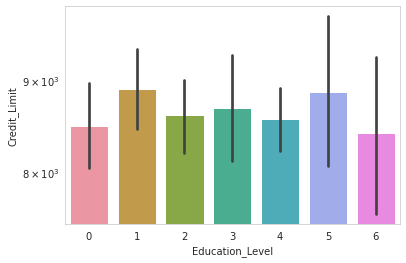

In [ ]:
sns.set_style('whitegrid')
sns.set_palette('cividis')
g = sns.barplot(x="Education_Level", y='Credit_Limit', data =df)
plt.yscale('log')

교육 수준에 따라서는 카드 한도와 큰 영향이 없어 보입니다.

## 4. Feature Engineering

### 1) 신용점수 패널티

정확한 신용점수의 공식은 공개되어 있지 않지만 Avg_Utilization_Ratio가 높을수록 신용도에 악영향을 준다는 사실은 잘 알려져 있습니다. (https://www.experian.com/blogs/ask-experian/what-is-revolving-credit/) 따라서 0.3 이상을 기준으로 신용점수 패널티를 줄 것입니다.

In [ ]:
creditscore[creditscore.Avg_Utilization_Ratio >= 0.3 ].sort_values(by='Avg_Utilization_Ratio')

,Total_Revolving_Bal,Credit_Limit,Avg_Utilization_Ratio,test
7665,971,3234.0,0.300,0.300247
1677,2103,7010.0,0.300,0.300000
2767,1747,5833.0,0.300,0.299503
9998,1254,4184.0,0.300,0.299713
7685,2417,8064.0,0.300,0.299727
...,...,...,...,...
1999,1428,1442.0,0.990,0.990291
7955,1798,1812.0,0.992,0.992274
1452,2457,2472.0,0.994,0.993932
7649,1853,1863.0,0.995,0.994632


### 2) 1분기에 비해 4분기에 거래가 늘거나 같은 사람

거래가 늘었으면 이탈할 확률이 적을 것이라 생각해서 특성으로 추가할 것입니다.

In [ ]:
def engineer(df):
  #1분기에 비해 4분기에 거래가 늘거나 같은 사람은 1
  df['More_trans'] = df['Total_Ct_Chng_Q4_Q1'].apply(lambda x: 1 if x >=1 else 0)
  
  #중복 특성 삭제
  df =df.drop(columns='Avg_Open_To_Buy', axis =1)

  #신용 점수 악영향
  df['Credit_score_penalty'] = df['Avg_Utilization_Ratio'].apply(lambda x: 1 if x > 0.3 else 0)
engineer(df)

In [ ]:
#df['Credit_score_penalty'] = df['Avg_Utilization_Ratio'].apply(lambda x: 1 if x > 0.3 else 0)

In [ ]:
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,More_trans,Credit_score_penalty
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1,0
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,1,0
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1,0
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1,1
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0,1
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0,1
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0,0
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0,0


## 5. 모델링

In [ ]:
df = df.drop(columns='CLIENTNUM')
df

In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.3, random_state=777, stratify=df['Attrition_Flag'])

In [ ]:
target = 'Attrition_Flag'
features = df.drop(columns=target).columns

X_train = train[features]
X_test = test[features]
y_train = train[target]
y_test = test[target]

In [ ]:
!pip install category_encoders

In [ ]:
from category_encoders import OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

pipe = make_pipeline(
    OrdinalEncoder(),
    RandomForestClassifier(n_estimators = 500, criterion='entropy', max_depth = 10, min_samples_leaf = 10, oob_score= True, n_jobs = -1, verbose=1, class_weight='balanced'))

pipe.fit(X_train, y_train)
print('검증 정확도: ', pipe.score(X_test, y_test))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    4.5s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.2s


검증 정확도:  0.947680157946693


[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    0.2s finished


## 6. 결과해석

In [ ]:
y_pred = pipe.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred)) 

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.2s


                   precision    recall  f1-score   support

Attrited Customer       0.80      0.90      0.85       488
Existing Customer       0.98      0.96      0.97      2551

         accuracy                           0.95      3039
        macro avg       0.89      0.93      0.91      3039
     weighted avg       0.95      0.95      0.95      3039



[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    0.2s finished


별다른 전처리나 조작 없이 랜덤 포레스트 모델을 학습시켜 예측한 결과 예측 타겟값인 attrited customer의 평가지표는 Precision: 0.78,  Recall: 0.90, f1 score: 0.84 였습니다. 문제가 된 중복된 특성을 지우고 같은 모델을 사용해 학습했는데 f1 score가 미세하게 올랐습니다. 여전히 f1 score가 높아서 더 많은 클래스인 existing customer로만 예측을 한 것은 아닌지 혼동행렬을 살펴보겠습니다.

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:    0.2s finished


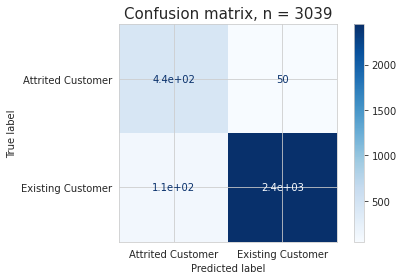

In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt


fig, ax = plt.subplots()
pcm = plot_confusion_matrix(pipe, X_test, y_test,
                            cmap=plt.cm.Blues,
                            ax=ax);
plt.title(f'Confusion matrix, n = {len(y_test)}', fontsize=15)
plt.show()

In [ ]:
cm = pcm.confusion_matrix
cm

array([[ 438,   50],
       [ 109, 2442]])

147: 1492로 existing customer로 예측한 비율이 더 높긴 하지만, 완전히 existing customer로만 예측한 것은 아닌 것 같습니다.

이제 이탈 고객을 예측하는 데 있어 중요 특성을 알아보겠습니다.

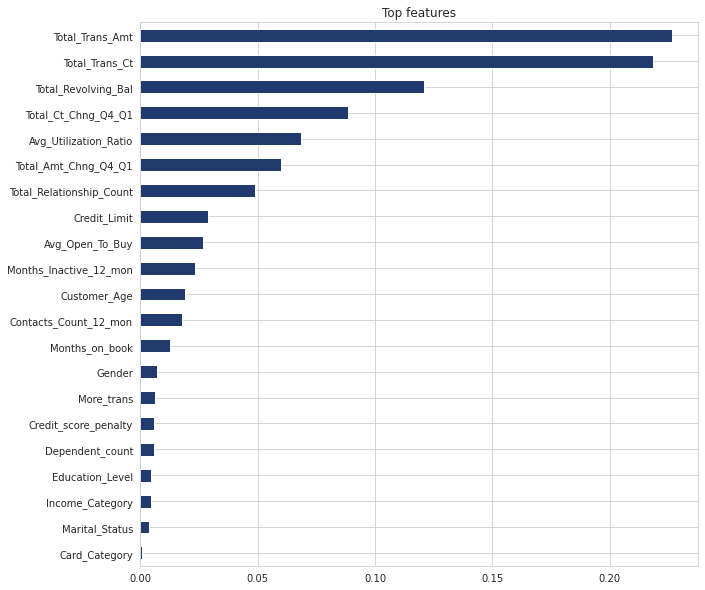

In [ ]:
rf = pipe.named_steps['randomforestclassifier']
importances_pipe = pd.Series(rf.feature_importances_, X_train.columns)

plt.figure(figsize=(10, 10))
plt.title(f'Top features')
importances_pipe.sort_values().plot.barh();

이탈 고객을 예측하는 데에 있어서 중요한 특성으로는 1)거래 대금 2)거래 횟수 3)리볼빙 금액(한 달 간 갚아야 하는 금액) 등이 있습니다. 활발하게 거래를 하는 고객일수록 이탈할 확률이 낮다고 할 수 있습니다. 따라서 거래가 활발하지 않은 고객들에게 이벤트 문자나 알림을 보내면 이탈 확률이 낮아지지 않을까 생각됩니다.